<a href="https://colab.research.google.com/github/nerbivol/siamese_damage_detection/blob/main/Damage_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import glob
import numpy as np
import pandas as pd
import random
from pathlib import Path
import tqdm.notebook

import cv2
import torch
from osgeo import gdal
import matplotlib.pyplot as plt
from PIL import Image
from IPython import display
from sklearn.model_selection import train_test_split

import yaml
from ultralytics import YOLO

In [ ]:
# checking availability of GPU resources
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

## Preprocesing

In [ ]:
base_path = "/content/drive/MyDrive"
folder_name = "Colab Notebooks/DamageBuilding"

In [ ]:
df = pd.read_csv(f'{base_path}/{folder_name}/annotations.csv')
df

,Unnamed: 0,image_id,bounds,damage_type
0,0,socal-fire_00001400_post_disaster.png,"(861, 997, 968, 1023)",no-damage
1,1,socal-fire_00001400_post_disaster.png,"(592, 980, 611, 1022)",no-damage
2,2,socal-fire_00001400_post_disaster.png,"(538, 1002, 583, 1020)",no-damage
3,3,socal-fire_00001400_post_disaster.png,"(540, 977, 581, 996)",no-damage
4,4,socal-fire_00001400_post_disaster.png,"(491, 965, 499, 984)",un-classified
...,...,...,...,...
183682,49,hurricane-michael_00000000_post_disaster.png,"(635, 608, 676, 644)",no-damage
183683,50,hurricane-michael_00000000_post_disaster.png,"(108, 530, 146, 568)",no-damage
183684,51,hurricane-michael_00000000_post_disaster.png,"(152, 525, 188, 563)",no-damage
183685,52,hurricane-michael_00000000_post_disaster.png,"(193, 521, 230, 559)",no-damage


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183687 entries, 0 to 183686
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Unnamed: 0   183687 non-null  int64 
 1   image_id     183687 non-null  object
 2   bounds       183687 non-null  object
 3   damage_type  183687 non-null  object
dtypes: int64(1), object(3)
memory usage: 5.6+ MB


In [ ]:
def getBounds(bounds):
    try: 
        bounds = tuple(map(int, bounds[1:-1].split(', ')))
        return bounds
    except:
        return np.nan


In [ ]:
def getWidth(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

In [ ]:
# Create bounds, width and height
df.loc[:,'bounds'] = df.loc[:,'bounds'].apply(getBounds)
df.loc[:,'width'] = df.loc[:,'bounds'].apply(getWidth)
df.loc[:,'height'] = df.loc[:,'bounds'].apply(getHeight)
df

,Unnamed: 0,image_id,bounds,damage_type,width,height
0,0,socal-fire_00001400_post_disaster.png,"(861, 997, 968, 1023)",no-damage,107,26
1,1,socal-fire_00001400_post_disaster.png,"(592, 980, 611, 1022)",no-damage,19,42
2,2,socal-fire_00001400_post_disaster.png,"(538, 1002, 583, 1020)",no-damage,45,18
3,3,socal-fire_00001400_post_disaster.png,"(540, 977, 581, 996)",no-damage,41,19
4,4,socal-fire_00001400_post_disaster.png,"(491, 965, 499, 984)",un-classified,8,19
...,...,...,...,...,...,...
183682,49,hurricane-michael_00000000_post_disaster.png,"(635, 608, 676, 644)",no-damage,41,36
183683,50,hurricane-michael_00000000_post_disaster.png,"(108, 530, 146, 568)",no-damage,38,38
183684,51,hurricane-michael_00000000_post_disaster.png,"(152, 525, 188, 563)",no-damage,36,38
183685,52,hurricane-michael_00000000_post_disaster.png,"(193, 521, 230, 559)",no-damage,37,38


In [ ]:
folder_img_name = "Colab Data/DamageBuilding"

image_path = f"{base_path}/{folder_img_name}/images"
pre_image = sorted(glob.glob(os.path.join(image_path, "*pre*")))
post_image = sorted(glob.glob(os.path.join(image_path, "*post*")))

In [ ]:
print(f"Found {len(post_image)} images files in {folder_name}")
pickone = random.choice(post_image)
img = Image.open(pickone)
IMAGE_HEIGHT, IMAGE_WIDTH = img.size
num_channels = len(img.mode)
print("Image size: {}".format((IMAGE_HEIGHT, IMAGE_WIDTH)))
print("Num channels: {}".format(num_channels))

Found 2719 images files in Colab Notebooks/DamageBuilding
Image size: (1024, 1024)
Num channels: 3


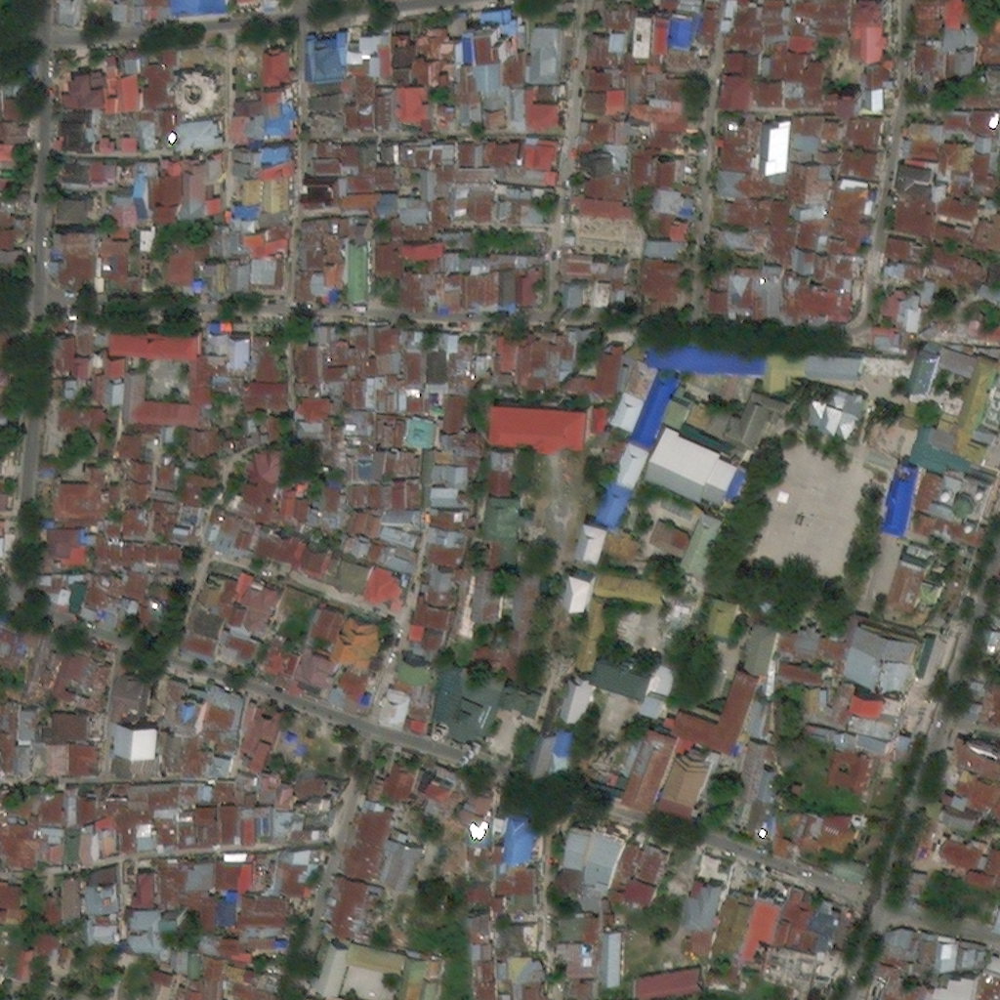

In [ ]:
display.Image(pickone)

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 1024, 1024
TILE_WIDTH = 512
TILE_HEIGHT = 512
TRUNCATED_PERCENT = 0.3
_overwriteFiles = True

TILES_DIR = {'train': Path('/content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/train/images/'),
             'valid': Path('/content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/valid/images/')}

for _, folder in TILES_DIR.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

LABELS_DIR = {'train': Path('/content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/train/labels/'),
              'valid': Path('/content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/valid/labels/')}

for _, folder in LABELS_DIR.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

In [ ]:
damage_dict = {
    "no-damage": 0,
    "minor-damage": 1,
    "major-damage": 2,
    "destroyed": 3,
    "un-classified": 0
}

In [ ]:
# Save one line in .txt file for each tag found inside the tile
def tag_is_inside_tile(bounds, x_start, y_start, damage, width, height, truncated_percent):
    x_min, y_min, x_max, y_max = bounds
    x_min, y_min, x_max, y_max = x_min - x_start, y_min - y_start, x_max - x_start, y_max - y_start

    if (x_min > width) or (x_max < 0.0) or (y_min > height) or (y_max < 0.0):
        return None
    
    x_max_trunc = min(x_max, width) 
    x_min_trunc = max(x_min, 0) 
    if (x_max_trunc - x_min_trunc) / (x_max - x_min) < truncated_percent:
        return None

    y_max_trunc = min(y_max, width) 
    y_min_trunc = max(y_min, 0) 
    if (y_max_trunc - y_min_trunc) / (y_max - y_min) < truncated_percent:
        return None
        
    x_center = (x_min_trunc + x_max_trunc) / 2.0 / width
    y_center = (y_min_trunc + y_max_trunc) / 2.0 / height
    x_extend = (x_max_trunc - x_min_trunc) / width
    y_extend = (y_max_trunc - y_min_trunc) / height

    return (damage_dict[damage], x_center, y_center, x_extend, y_extend)

In [ ]:
train, valid = train_test_split(pre_image, train_size=0.8)
# train, test = train_test_split(train, train_size=0.95)

print("Train test:", len(train))
print("Valid test:", len(valid))
# print("Test test:", len(test))

Train test: 2175
Valid test: 544


In [ ]:
def cut_images(images, folder='train', time='pre'):
  for img_path in tqdm.notebook.tqdm(images):
      np_img = np.array(Image.open(img_path, mode='r'), dtype=np.uint8)

      img_name = img_path.split('/')[-1]
      if time=='post':
        img_labels = df[df["image_id"] == img_name]
      else:
        img_labels = df[df["image_id"] == img_name.replace('pre', 'post')]

      X_TILES = IMAGE_WIDTH  // TILE_WIDTH
      Y_TILES = IMAGE_HEIGHT // TILE_HEIGHT
      
      for i, x in enumerate(range(X_TILES)):
          for j, y in enumerate(range(Y_TILES)):

              x_end = min((x + 1) * TILE_WIDTH, IMAGE_WIDTH)
              x_start = x_end - TILE_WIDTH
              y_end = min((y + 1) * TILE_HEIGHT, IMAGE_HEIGHT)
              y_start = y_end - TILE_HEIGHT

              # print(f"{x_start}_{x_end}_{y_start}_{y_end}")
              
              save_tile_path = TILES_DIR[folder].joinpath(img_name[:-13] + "_" + str(i) + "_" + str(j) + ".jpg")
              save_label_path = LABELS_DIR[folder].joinpath(img_name[:-13] + "_" + str(i) + "_" + str(j) + ".txt")
              

              if time=='post':
                found_boxs = [
                    tag_is_inside_tile(bounds, x_start, y_start, damage, TILE_WIDTH, TILE_HEIGHT, TRUNCATED_PERCENT)
                    for bounds, damage in zip(img_labels.bounds, img_labels.damage_type)]
              else:
                damage = 'no-damage'
                found_boxs = [
                    tag_is_inside_tile(bounds, x_start, y_start, damage, TILE_WIDTH, TILE_HEIGHT, TRUNCATED_PERCENT)
                    for bounds in img_labels.bounds]

              found_boxs = [box for box in found_boxs if box is not None]

              if found_boxs:
                with open(save_label_path, 'w+') as f:
                  for tags in found_boxs:
                      f.write(' '.join(str(x) for x in tags) + '\n')

                if _overwriteFiles or not os.path.isfile(save_tile_path):
                  cut_tile = np.zeros(shape=(TILE_WIDTH, TILE_HEIGHT, 3), dtype=np.uint8)
                  cut_tile[0:TILE_HEIGHT, 0:TILE_WIDTH, :] = np_img[y_start:y_end, x_start:x_end, :]
                  cut_tile_img = Image.fromarray(cut_tile)
                  cut_tile_img.save(save_tile_path)

In [ ]:
cut_images(pre_image, time='pre')

  0%|          | 0/2719 [00:00<?, ?it/s]

In [ ]:
cut_images(valid, folder='valid')

  0%|          | 0/544 [00:00<?, ?it/s]

## YOLO detection

In [ ]:
from pathlib import Path

base_path = "/content/drive/MyDrive/Colab Notebooks"

# Change the current working directory to the Google Drive directory
os.chdir(f'{base_path}')

# Change directory to cloned repository
folder_name = "DamageBuilding"
Path(f'{base_path}/{folder_name}').mkdir(parents=True, exist_ok=True)
os.chdir(f'{base_path}/{folder_name}')

!pwd

!ls

/content/drive/MyDrive/Colab Notebooks/DamageBuilding
annotations.csv      data.yaml	       runs		       valid
clasify		     PostImages        Siamese_classify.ipynb  yolov8n.pt
Damage_YOLOv8.ipynb  preprocess.ipynb  train		       yolov8s.pt


In [ ]:
CONFIG = """names: ['roof']
nc: 1
train: train/images
val: valid/images
"""

with open("data.yaml", "w") as f:
    f.write(CONFIG)

In [ ]:
print("yaml file parameters:\n")

with open('data.yaml') as stream:
    data_loaded = yaml.safe_load(stream)
data_loaded

yaml file parameters:



{'names': ['roof'], 'nc': 1, 'train': 'train/images', 'val': 'valid/images'}

In [ ]:
model_name = 'yolov8s.pt' 
data = f'{base_path}/{folder_name}/data.yaml' 
epochs = 50 
resume = False  # resume training from last checkpoint
imgsz = 512 
optimizer = "Adam" 
lr0 = 3E-04 

In [ ]:
model = YOLO(model_name)
results = model.train(data=data, epochs=epochs, resume=resume, imgsz=imgsz, optimizer=optimizer, lr0=lr0)

Ultralytics YOLOv8.0.105 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/Colab Notebooks/DamageBuilding/data.yaml, epochs=50, patience=50, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False

In [ ]:
results = model.val()

Ultralytics YOLOv8.0.105 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/labels.cache... 1163 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1163/1163 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:49<00:00,  1.47it/s]
                   all       1163      34986      0.607      0.521      0.556      0.304
Speed: 0.4ms preprocess, 6.4ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/val


In [ ]:
model = YOLO("runs/detect/train6/weights/best.pt")

In [ ]:
def plot_random_images_with_boxes(image_file):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(30, 15))
    
    image_path = os.path.join(image_folder, image_file)
    annotation_path = os.path.join(annotation_folder, os.path.splitext(image_file)[0] + ".txt")

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    with open(annotation_path, "r") as f:
        annotations = f.readlines()

    ax1.imshow(image)
    ax1.set_title('Image', fontsize=24)

    for annotation in annotations:
        class_id, x, y, width, height = map(float, annotation.split())
        left = int((x - width / 2) * image.shape[1])
        top = int((y - height / 2) * image.shape[0])
        right = int((x + width / 2) * image.shape[1])
        bottom = int((y + height / 2) * image.shape[0])

        cv2.rectangle(image, (left, top), (right, bottom), (255, 0, 0), 2)

    ax2.imshow(image)
    ax2.set_title('True label', fontsize=24)

    pred_image = cv2.imread(f'runs/detect/predict/1/{image_file}')
    pred_image = cv2.cvtColor(pred_image, cv2.COLOR_BGR2RGB)
    ax3.imshow(pred_image)
    ax3.set_title('Predict label', fontsize=24)

    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    plt.show()


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/images/hurricane-michael_00000026_pre_disaster_512_512.jpg: 512x512 18 roofs, 412.5ms
Speed: 2.0ms preprocess, 412.5ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict/1


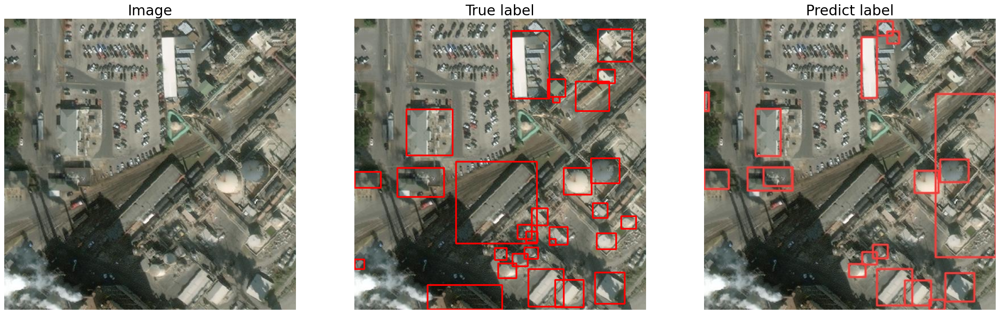


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/images/socal-fire_00000950_pre_disaster_0_512.jpg: 512x512 20 roofs, 466.3ms
Speed: 2.0ms preprocess, 466.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict/1


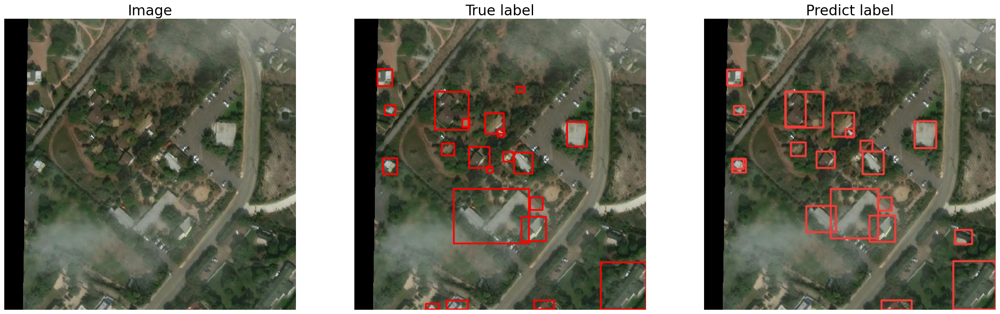


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/images/hurricane-michael_00000152_pre_disaster_512_0.jpg: 512x512 9 roofs, 440.8ms
Speed: 2.0ms preprocess, 440.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict/1


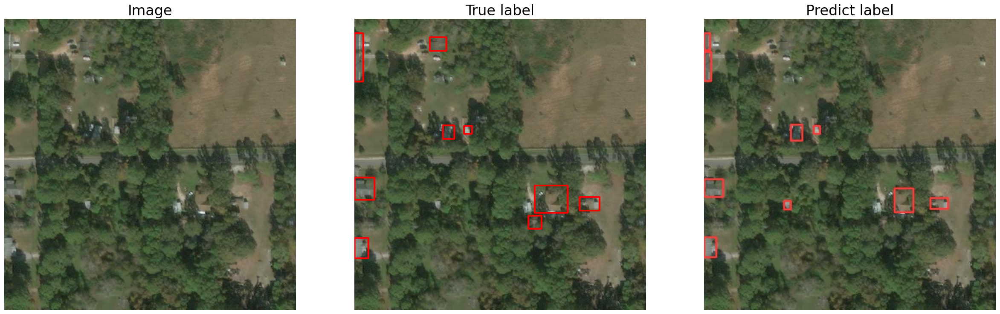


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/images/socal-fire_00000630_pre_disaster_512_512.jpg: 512x512 32 roofs, 447.7ms
Speed: 2.1ms preprocess, 447.7ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict/1


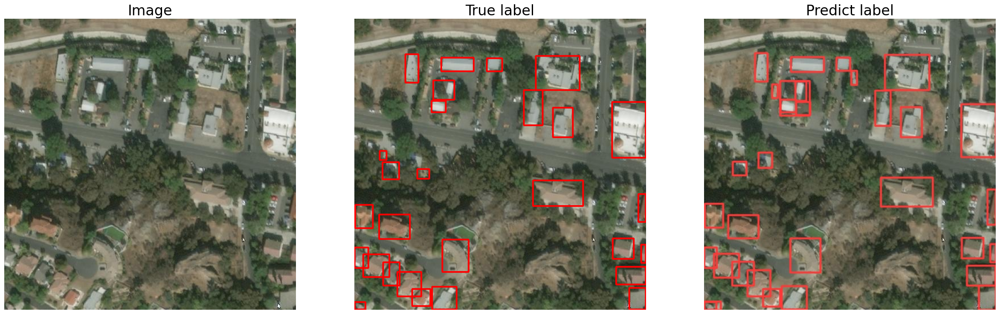


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/valid/images/mexico-earthquake_00000117_pre_disaster_0_512.jpg: 512x512 214 roofs, 695.4ms
Speed: 1.9ms preprocess, 695.4ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict/1


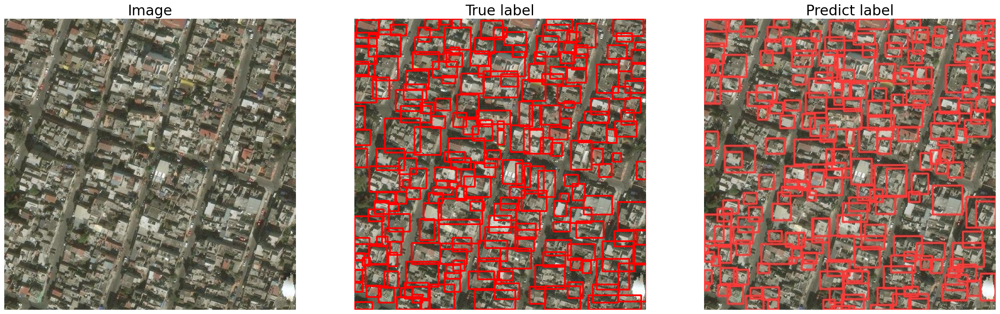

In [ ]:
# Example usage
image_folder = 'valid/images'
annotation_folder = 'valid/labels'
num_images = 5

image_files = os.listdir(image_folder)
random.shuffle(image_files)
image_files = image_files[:num_images]

for image_file in image_files:
  results = model.predict(source=f'valid/images/{image_file}', name='predict/1', show_labels=False, save=True, retina_masks=True)
  plot_random_images_with_boxes(image_file)